# E/I Balance — Mid-Layer Activation Visualization

Analyze intermediate convolutional layer activations under different E/I slope conditions. Computes the percentage of inactive neurons (activations below threshold) per layer to quantify how E/I imbalance affects internal representations.


## 1. Imports


In [41]:
# import cv2 as cv
import os
#create metadata.csv file for model training.
import csv
import pandas as pd
import numpy as np

import keras
import keras.utils as image
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns

from keras.models import Sequential, Model
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import BatchNormalization
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, BatchNormalization, GaussianNoise, Layer
from keras.optimizers import Adam
from keras import Input
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tqdm import tqdm
from tensorflow.keras.utils import load_img, img_to_array


import scipy.spatial as sp, scipy.cluster.hierarchy as hc
import matplotlib.pyplot as plt


## 2. Model and Training Functions


In [42]:

df = pd.read_csv("images_data.csv")
train_accuracies_dict = {}
train_accuracies = {}

train_loss_dict = {}
train_losses = {}

val_losses = {}
val_losses_dict = {}
val_accuracies = {}
val_accuracies_dict = {}
trained_Model = {}

# Define the custom activation function
def custom_relu(x, slope_positive):
    return tf.where(x > 0, slope_positive * x, tf.zeros_like(x))

# Create a custom Keras layer for the activation function
class CustomReLU(Layer):
    def __init__(self, slope_positive, **kwargs):
        super(CustomReLU, self).__init__(**kwargs)
        self.slope_positive = slope_positive

    def call(self, inputs):
        return custom_relu(inputs, self.slope_positive)

def model_test_slope(size, slope, n_epochs, filter_size, Is_model_display, g = 0):
    global trained_Model
    
    person_names_path = "training_data/10_images_celebrities/croped_img"
    # person_names_path = "dataSet/croped_img"
    X_dataset = []
    pad_value = 1
    SIZE = size
    #import all img as array into X
    for i in os.listdir(person_names_path): # i = person_name
        person_folder = os.path.join(person_names_path, i)
        if( i == ".DS_Store"):
            continue
        # Iterate over each image file in the person's folder
        for img_file in os.listdir(person_folder):
            img = image.load_img(os.path.join(person_folder,img_file),target_size=(SIZE,SIZE))
            img = image.img_to_array(img)
            img = img/255
            img = np.pad(img, ((1, 1), (1, 1), (0, 0)), mode='constant', constant_values=pad_value)
            X_dataset.append(img)

    X = np.array(X_dataset)
    Y = np.array(df.drop(['img_id'],axis = 1))

    X_train = []
    Y_train = []
    X_test = []
    Y_test = []

    for i in range(len(X)):
        if i % 5 == 0:  # Select every first element for the test set
            X_test.append(X[i])
            Y_test.append(Y[i])
        else:
            X_train.append(X[i])
            Y_train.append(Y[i])

    # Convert lists back to numpy arrays
    X_train = np.array(X_train)
    Y_train = np.array(Y_train)
    X_test = np.array(X_test)
    Y_test = np.array(Y_test)

    SIZE += pad_value * 2
    
    model = Sequential()

    # Block 1
    model.add(Conv2D(filters=filter_size, kernel_size=(5, 5), input_shape=(SIZE, SIZE, 3), padding="same", name='conv_block1_conv'))
    model.add(CustomReLU(slope, name='conv_block1_relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.2))
    model.add(GaussianNoise(stddev=g))

    # Block 2
    filter_size *= 2
    model.add(Conv2D(filters=filter_size, kernel_size=(5, 5), name='conv_block2_conv'))
    model.add(CustomReLU(slope, name='conv_block2_relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.2))
    model.add(GaussianNoise(stddev=g))

    # Block 3
    filter_size *= 2
    model.add(Conv2D(filters=filter_size, kernel_size=(5, 5), name='conv_block3_conv'))
    model.add(CustomReLU(slope, name='conv_block3_relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.2))
    model.add(GaussianNoise(stddev=g))

    # Rest of the model
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(10, activation='softmax'))

    model.summary()
    trained_Model[slope] = model

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])



    for temp in range(n_epochs):
      X_train = []
      Y_train = []
      X_test = []
      Y_test = []

      testingIndex = [index for index in range(temp % 5,50,5)]
         

      for i in range(len(X)):
          if i in testingIndex:  # Select every 5th element for the test set
              X_test.append(X[i])
              Y_test.append(Y[i])
          else:
              X_train.append(X[i])
              Y_train.append(Y[i])

      # Convert lists back to numpy arrays
      X_train = np.array(X_train)
      Y_train = np.array(Y_train)
      X_test = np.array(X_test)
      Y_test = np.array(Y_test)

      history = model.fit(X_train, Y_train, epochs=1, validation_data=(X_test, Y_test), batch_size=64, verbose=Is_model_display)  

      # Save the metrics for this input size
      if slope not in train_accuracies:
        train_accuracies[slope] = []
        val_accuracies[slope] = []
        train_losses[slope] = []
        val_losses[slope] = []

      train_accuracies[slope].extend(history.history['accuracy'])
      val_accuracies[slope].extend(history.history['val_accuracy'])
      train_losses[slope].extend(history.history['loss'])
      val_losses[slope].extend(history.history['val_loss'])


def plot_metrics_acc(metrics_dict, epochs_num, title, ylabel, fs):
    plt.figure(figsize=(30, 15))
    step = int(epochs_num / 10)
    error_bar_positions = np.arange(step, epochs_num+1, step)
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'orange', 'purple', 'brown']
    color_index = 0
    for slope, m_list in metrics_dict.items():
      
        arr = np.array(m_list).T
        m_means = arr.mean(axis=1)
        m_stds = arr.std(axis=1)
        current_color = colors[color_index % len(colors)]
        
        plt.plot(range(len(arr)), m_means, label=f'Slope {slope}', color=current_color)
        for i in error_bar_positions:
          if(i == 0):
            continue
          plt.errorbar(i, m_means[i-1], yerr=m_stds[i-1], fmt='.', capsize=5, color=current_color)
        color_index += 1

    title = title + " filter_size = " + str(fs)

    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel(ylabel)
    plt.legend()
    plt.grid(True)
    plt.show()



def loop_slope(num, input_size, slope_array, ep, fs, Is_model_display=1):
  train_accuracies_dict.clear()
  train_accuracies.clear()

  train_loss_dict.clear()
  train_losses.clear()

  val_accuracies.clear()
  val_accuracies_dict.clear()

  val_losses.clear()
  val_losses_dict.clear()
  # total_error_dict = {s: [] for s in slope_array}
  for iteration in range(num):
    for s in  slope_array:
      print("slope = ", s)
      model_test_slope(input_size, s, ep, fs,Is_model_display, 0)

      if(s not in train_accuracies_dict):
        train_accuracies_dict[s] = []

      if(s not in train_loss_dict):
        train_loss_dict[s] = []

      
      if(s not in val_losses_dict):
        val_losses_dict[s] = []

      if(s not in val_accuracies_dict):
        val_accuracies_dict[s] = []
        
      train_loss_dict[s].append(train_losses[s])
      train_accuracies_dict[s].append(train_accuracies[s])

      val_losses_dict[s].append(val_losses[s])
      val_accuracies_dict[s].append(val_accuracies[s])

  plot_metrics_acc(train_loss_dict, ep, 'Training Losses for Different Relu_slop', 'Losses', fs)
  plot_metrics_acc(train_accuracies_dict, ep, 'Training Accuracy for Different Relu_slop', 'Accuracy', fs)

  plot_metrics_acc(val_losses_dict, ep, 'Validation Losses for Different Relu_slop', 'Losses', fs)
  plot_metrics_acc(val_accuracies_dict, ep, 'Validation Accuracy for Different Relu_slop', 'Accuracy', fs)
  

      
   

## 3. Single-Run Pilot

Train one model per slope to verify the pipeline before the full 20-run batch.


In [43]:
loop_slope(num=1, input_size=200, slope_array=[0.005, 0.05, 0.5], ep=750, fs=16, Is_model_display=0)

slope =  0.005
Model: "sequential_134"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_block1_conv (Conv2D)   (None, 202, 202, 16)      1216      
                                                                 
 conv_block1_relu (CustomReL  (None, 202, 202, 16)     0         
 U)                                                              
                                                                 
 batch_normalization_402 (Ba  (None, 202, 202, 16)     64        
 tchNormalization)                                               
                                                                 
 max_pooling2d_402 (MaxPooli  (None, 101, 101, 16)     0         
 ng2D)                                                           
                                                                 
 dropout_670 (Dropout)       (None, 101, 101, 16)      0         
                                     

KeyboardInterrupt: 

## 4. Inactive Neuron Analysis Functions

Define functions to extract layer activations and compute the percentage of neurons with near-zero output.


In [15]:

def calculate_inactive_neurons(activation, threshold=1e-3):
    """
    Calculate the percentage of inactive neurons in a layer's activation.
    
    Parameters:
    - activation: The activation output of a layer.
    - threshold: The value below which a neuron is considered inactive (default is 1e-3).
    
    Returns:
    - The percentage of inactive neurons.
    """
    # Flatten the activation to count the total number of neurons
    total_neurons = np.prod(activation.shape)
    
    # Count the number of neurons below the threshold (inactive)
    inactive_neurons = np.sum(np.abs(activation) < threshold)
    
    # Calculate the percentage of inactive neurons
    inactive_percentage = (inactive_neurons / total_neurons) * 100
    return inactive_percentage

def analyze_inactive_neurons_all_images(model_dict, layer_names, img_dir, img_size=200, pad_value=1):
    """
    Analyze the percentage of inactive neurons in the specified layers for different models, using all images in the directory.
    
    Parameters:
    - model_dict: Dictionary with slope values as keys and trained models as values.
    - layer_names: A list of layer names to analyze for inactive neurons.
    - img_dir: The directory containing images to use for analysis.
    - img_size: Size to resize each input image.
    - pad_value: Padding value to add around each image.
    
    Returns:
    - A dictionary with slope values as keys and average inactive neuron percentages for each layer as values.
    """
    results = {slope: {layer: [] for layer in layer_names} for slope in model_dict.keys()}

    # Iterate over all images in the given directory
    for root, _, files in os.walk(img_dir):
        for file in files:
            if file.endswith(('png', 'jpg', 'jpeg')):
                # Load and preprocess the image
                img_path = os.path.join(root, file)
                img = image.load_img(img_path, target_size=(img_size, img_size))
                img = image.img_to_array(img)
                img = img / 255.0
                img = np.pad(img, ((pad_value, pad_value), (pad_value, pad_value), (0, 0)), mode='constant', constant_values=pad_value)
                img = np.expand_dims(img, axis=0)  # Adding batch dimension

                # Analyze each model for the current image
                for slope, model in model_dict.items():
                    # Extract activations for the specified layers
                    outputs = [model.get_layer(name).output for name in layer_names]
                    activation_model = Model(inputs=model.input, outputs=outputs)
                    activations = activation_model.predict(img)

                    # Calculate and store inactive neuron percentages for each layer
                    for i, layer_name in enumerate(layer_names):
                        inactive_percentage = calculate_inactive_neurons(activations[i])
                        results[slope][layer_name].append(inactive_percentage)

    # Calculate the average inactive neuron percentage for each slope and layer
    avg_results = {}
    for slope, layers in results.items():
        avg_results[slope] = {}
        for layer_name, percentages in layers.items():
            avg_results[slope][layer_name] = np.mean(percentages)
    
    return avg_results



In [16]:
# Example usage
img_dir = 'training_data/10_images_celebrities/croped_img'
layer_names_to_visualize = [
    'conv_block1_relu', 'conv_block2_relu', 'conv_block3_relu'
]

# Analyze inactive neurons using all images in the directory
avg_inactive_neurons_results = analyze_inactive_neurons_all_images(trained_Model, layer_names_to_visualize, img_dir)

# Print the results in a readable format
def print_inactive_neurons_results(results):
    for slope, layer_results in results.items():
        print(f"\nModel with Slope: {slope}")
        for layer_name, inactive_percentage in layer_results.items():
            print(f"  Layer: {layer_name}, Average Inactive Neurons: {inactive_percentage:.2f}%")

print_inactive_neurons_results(avg_inactive_neurons_results)


## 5. Full 20-Run Training with Inactive Neuron Logging


In [36]:
df = pd.read_csv("images_data.csv")

def calculate_inactive_neurons(activation, threshold=1e-3):
    """
    Calculate the percentage of inactive neurons in a layer's activation.

    Parameters:
    - activation: The activation output of a layer.
    - threshold: The value below which a neuron is considered inactive (default is 1e-3).

    Returns:
    - The percentage of inactive neurons.
    """
    # Flatten the activation to count the total number of neurons
    total_neurons = np.prod(activation.shape)
    
    # Count the number of neurons below the threshold (inactive)
    inactive_neurons = np.sum(np.abs(activation) < threshold)
    
    # Calculate the percentage of inactive neurons
    inactive_percentage = (inactive_neurons / total_neurons) * 100
    return inactive_percentage

def analyze_inactive_neurons_single_image(activation_model, layer_names, img):
    """
    Analyze the percentage of inactive neurons in the specified layers for the given activation model and image.

    Parameters:
    - activation_model: Model used for extracting activations of specified layers.
    - layer_names: A list of layer names to analyze for inactive neurons.
    - img: The single input image to use for analysis.

    Returns:
    - A dictionary containing the percentage of inactive neurons for each specified layer.
    """
    # Predict activations for the specified layers
    activations = activation_model.predict(img)

    # Calculate and store inactive neuron percentages for each layer
    inactive_neurons_dict = {}
    for i, layer_name in enumerate(layer_names):
        inactive_percentage = calculate_inactive_neurons(activations[i])
        inactive_neurons_dict[layer_name] = inactive_percentage

    return inactive_neurons_dict

def model_test_slope(size, slope, n_epochs, filter_size, Is_model_display, X, Y, g=0):
    pad_value = 1
    SIZE = size + pad_value * 2  # Adjusted for padding

    # Prepare data for training and testing
    X_train_list, Y_train_list, X_test_list, Y_test_list = [], [], [], []
    for i in range(len(X)):
        if i % 5 == 0:
            X_test_list.append(X[i])
            Y_test_list.append(Y[i])
        else:
            X_train_list.append(X[i])
            Y_train_list.append(Y[i])

    X_train_full = np.array(X_train_list)
    Y_train_full = np.array(Y_train_list)
    X_test_full = np.array(X_test_list)
    Y_test_full = np.array(Y_test_list)

    model = Sequential()

    # Model architecture
    model.add(Conv2D(filters=filter_size, kernel_size=(5, 5), input_shape=(SIZE, SIZE, 3),
                     padding="same", name='conv_block1_conv'))
    model.add(CustomReLU(slope, name='conv_block1_relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.2))
    model.add(GaussianNoise(stddev=g))

    filter_size *= 2
    model.add(Conv2D(filters=filter_size, kernel_size=(5, 5), name='conv_block2_conv'))
    model.add(CustomReLU(slope, name='conv_block2_relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.2))
    model.add(GaussianNoise(stddev=g))

    filter_size *= 2
    model.add(Conv2D(filters=filter_size, kernel_size=(5, 5), name='conv_block3_conv'))
    model.add(CustomReLU(slope, name='conv_block3_relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.2))
    model.add(GaussianNoise(stddev=g))

    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(10, activation='softmax'))

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Prepare to store results of inactive neurons
    layer_names = ['conv_block1_relu', 'conv_block2_relu', 'conv_block3_relu']
    inactive_results = {slope: {layer: None for layer in layer_names}}

    # Create the activation model once
    outputs = [model.get_layer(name).output for name in layer_names]
    activation_model = Model(inputs=model.input, outputs=outputs)

    # Train the model for the total number of epochs
    history = model.fit(X_train_full, Y_train_full, epochs=n_epochs, validation_data=(X_test_full, Y_test_full),
                        batch_size=64, verbose=Is_model_display)

    # Analyze inactive neurons using a sample image
    single_img = np.expand_dims(X_test_full[0], axis=0)  # Use one sample from test data for analysis
    inactive_percentages = analyze_inactive_neurons_single_image(activation_model, layer_names, single_img)
    for layer_name, inactive_percentage in inactive_percentages.items():
        inactive_results[slope][layer_name] = inactive_percentage

    # Delete model and free memory
    del model
    del activation_model
    gc.collect()

    return inactive_results

def loop_slope(num, input_size, slope_array, ep, fs, Is_model_display=1):
    # Load data once outside the loops
    person_names_path = "training_data/10_images_celebrities/croped_img"
    X_dataset = []
    pad_value = 1
    SIZE = input_size

    print("Loading data...")
    # Import all images as array into X
    for i in os.listdir(person_names_path):  # i = person_name
        person_folder = os.path.join(person_names_path, i)
        if i == ".DS_Store":
            continue
        for img_file in os.listdir(person_folder):
            img_path = os.path.join(person_folder, img_file)
            img = image.load_img(img_path, target_size=(SIZE, SIZE))
            img = image.img_to_array(img)
            img = img / 255.0
            img = np.pad(img, ((pad_value, pad_value), (pad_value, pad_value), (0, 0)),
                         mode='constant', constant_values=pad_value)
            X_dataset.append(img)

    X = np.array(X_dataset)
    Y = np.array(df.drop(['img_id'], axis=1))

    # Check if CSV file exists; if not, write headers
    csv_file = "EIB_inactive_neurons_results.csv"
    if not os.path.exists(csv_file):
        with open(csv_file, mode='w', newline='') as file:
            writer = csv.writer(file)
            writer.writerow(['Iteration', 'Slope', 'Layer', 'Inactive_Percentage'])

    for iteration in range(num):
        print(f"Iteration {iteration + 1} of {num}")

        for s in slope_array:
            print(f"Slope = {s}")

            # Train the model for the current slope
            inactive_results = model_test_slope(input_size, s, ep, fs, Is_model_display, X, Y)

            # Record and write results to CSV file
            for slope, layer_results in inactive_results.items():
                for layer_name, percentage in layer_results.items():
                    # Write results to CSV file after each model
                    with open(csv_file, mode='a', newline='') as file:
                        writer = csv.writer(file)
                        writer.writerow([iteration, slope, layer_name, percentage])

    print(f"Results saved to {csv_file}")



In [37]:
loop_slope(num=20, input_size=200, slope_array=[0.005, 0.05, 0.5], ep=750, fs=16, Is_model_display=0)

Loading data...
Iteration 1 of 20
Slope = 0.005
1/1 [==============================] - 0s 63ms/step
Slope = 0.05
1/1 [==============================] - 0s 66ms/step
Slope = 0.5
1/1 [==============================] - 0s 63ms/step
Iteration 2 of 20
Slope = 0.005
1/1 [==============================] - 0s 62ms/step
Slope = 0.05
1/1 [==============================] - 0s 64ms/step
Slope = 0.5
1/1 [==============================] - 0s 61ms/step
Iteration 3 of 20
Slope = 0.005
1/1 [==============================] - 0s 64ms/step
Slope = 0.05
1/1 [==============================] - 0s 63ms/step
Slope = 0.5
1/1 [==============================] - 0s 62ms/step
Iteration 4 of 20
Slope = 0.005
1/1 [==============================] - 0s 63ms/step
Slope = 0.05
1/1 [==============================] - 0s 62ms/step
Slope = 0.5
1/1 [==============================] - 0s 62ms/step
Iteration 5 of 20
Slope = 0.005
1/1 [==============================] - 0s 62ms/step
Slope = 0.05
1/1 [==============================

## 6. Aggregate Results

Load the CSV of inactive neuron percentages and compute summary statistics by slope and layer.


Layer  conv_block1_relu  conv_block2_relu  conv_block3_relu
Slope                                                      
0.005         48.380091         53.033067         75.138615
0.050         75.337306         73.663696         70.560151
0.500         49.303362         50.015809         52.676185


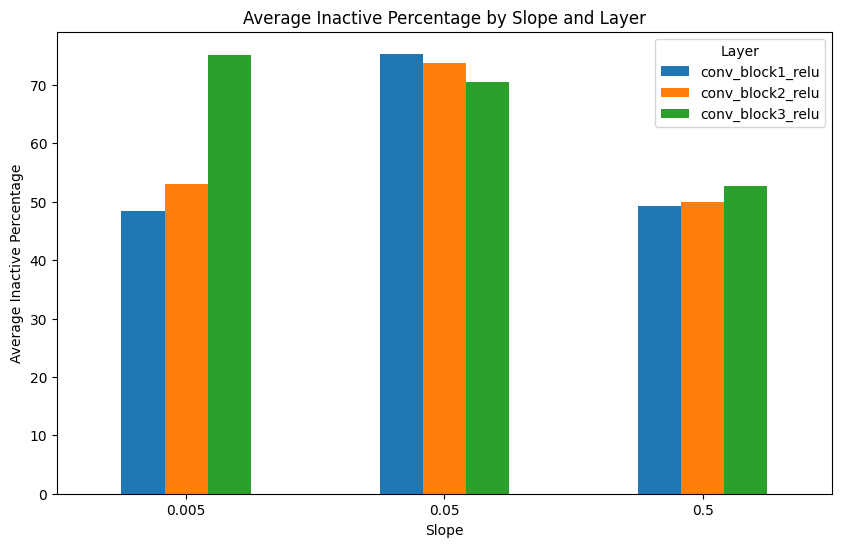

In [40]:
# Read the CSV file
df = pd.read_csv('EIB_inactive_neurons_results.csv')

# Group by Slope and Layer, compute mean of Inactive_Percentage
grouped = df.groupby(['Slope', 'Layer'])['Inactive_Percentage'].mean().reset_index()

# Pivot the table for better visualization
pivot_table = grouped.pivot(index='Slope', columns='Layer', values='Inactive_Percentage')

# Print the pivot table
print(pivot_table)

# Plot the results
pivot_table.reset_index(inplace=True)
pivot_table.plot(x='Slope', kind='bar', figsize=(10,6))
plt.title('Average Inactive Percentage by Slope and Layer')
plt.xlabel('Slope')
plt.ylabel('Average Inactive Percentage')
plt.xticks(rotation=0)
plt.legend(title='Layer')
plt.show()

## 7. Single-Image Activation Maps

Visualize the activation patterns for a single example image across all three slope conditions.


1/1 [==============================] - 0s 66ms/step
Visualizing layer: conv_block1_conv


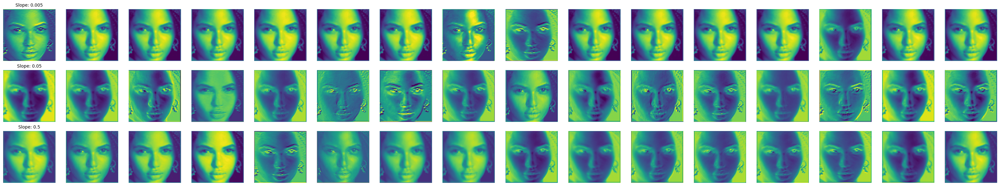

Visualizing layer: conv_block1_relu


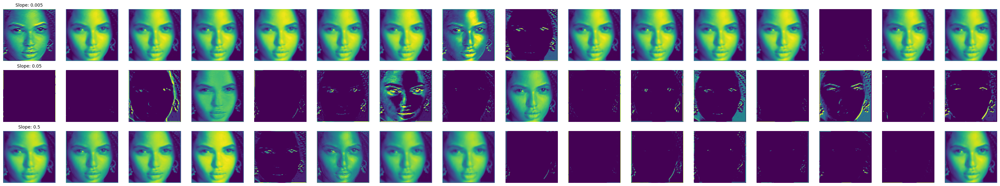

Visualizing layer: conv_block2_conv


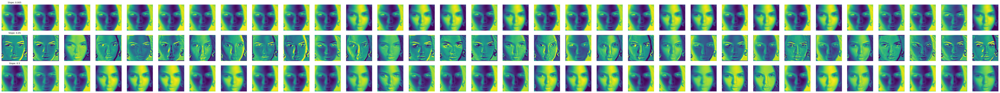

Visualizing layer: conv_block2_relu


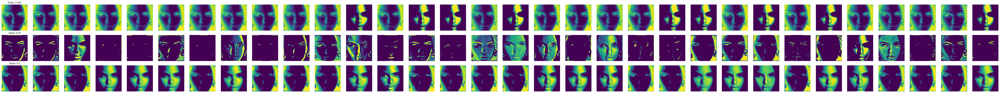

Visualizing layer: conv_block3_conv


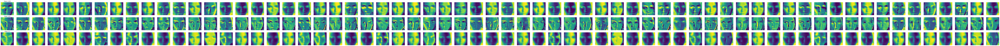

Visualizing layer: conv_block3_relu


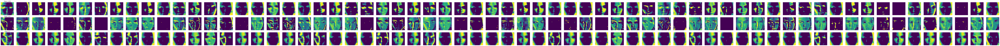

In [24]:
SIZE = 200
pad_value = 1

single_image_path = 'training_data/10_images_celebrities/croped_img/juliana/juliana_0.png'
single_img = image.load_img(single_image_path, target_size=(SIZE, SIZE))
single_img = image.img_to_array(single_img)
single_img = single_img / 255.0
single_img = np.pad(single_img, ((pad_value, pad_value), (pad_value, pad_value), (0, 0)), mode='constant', constant_values=pad_value)
single_img = np.expand_dims(single_img, axis=0)

# Specify the layer names
layer_names_to_visualize = [
    'conv_block1_conv', 'conv_block1_relu',
    'conv_block2_conv', 'conv_block2_relu',
    'conv_block3_conv', 'conv_block3_relu'
]

visualize_activations_by_slope_in_full_row(trained_Model, layer_names_to_visualize, single_img)